In [1]:
import pandas as pd
import folium
import numpy as np
from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

%matplotlib inline

plt.style.use('ggplot')
plt.rcParams['figure.figsize'] = (18,10)

In [2]:
data = pd.read_csv('data.csv', sep='\t', index_col=0)

In [3]:
del data['amenity_public_bath']
lat = data['lat']
lon = data['lon']
del data['lat']
del data['lon']

In [4]:
data.head()

,amenity_hospital,shop_convenience,shop_convenience_3,amenity_nightclub,amenity_fast_food,amenity_fast_food_3,man_made_works,amenity_doctors,leisure_sports_centre,amenity_theatre,...,leisure_playground_3,amenity_dentist,railway_tram_stop,amenity_restaurant,amenity_restaurant_3,shop_supermarket,shop_supermarket_3,amenity_arts_centre,build_year,dist_to_center
0,2512.1,342.1,453.133333,8382.6,2275.9,2293.7,9954.3,346.2,1464.6,6056.6,...,267.333333,386.3,9880.4,1625.5,1667.2,349.6,528.200000,1501.7,1988,16244.8
1,2573.7,280.5,432.600000,8444.2,2337.5,2355.3,9892.7,284.6,1526.2,6118.2,...,249.733333,324.7,9942.0,1616.3,1705.2,288.0,466.600000,1563.3,1988,16306.4
2,2678.4,232.4,435.433333,8548.9,2442.2,2460.0,9788.0,236.5,1493.7,6222.9,...,171.066667,276.6,10046.7,1511.6,1740.1,239.9,380.766667,1668.0,1988,16411.1
3,2775.3,413.9,630.833333,8904.2,2797.5,2815.3,9866.7,317.8,1381.6,6578.2,...,98.400000,369.7,10402.0,1758.0,2059.1,406.4,585.800000,2023.3,1988,16766.4
4,2964.5,431.9,688.433333,8867.1,2760.4,2778.2,10055.7,280.7,1298.9,6541.1,...,148.300000,445.9,10364.9,1870.0,2071.7,439.4,675.633333,1986.2,1988,16729.3


In [20]:
model = KMeans(n_clusters=10, max_iter=300)

In [6]:
X = data.values

In [7]:
X = (X - X.mean(0)) / X.std(0)

In [21]:
y = model.fit_predict(X)

In [22]:
mos_center = [55.750475, 37.619020]
moscow = folium.Map(location=mos_center, zoom_start=11, control_scale=True)

In [24]:
color_names = ['red', 'blue', 'green', 'yellow', 'orange', 'grey', 'pink', 'black', 'white', 'purple']
colors = map(lambda i: color_names[i], y)

In [25]:
for lt, ln, c in zip(lat, lon, colors):
    folium.CircleMarker(location=[lt, ln], radius=1, color=c).add_to(moscow)
moscow

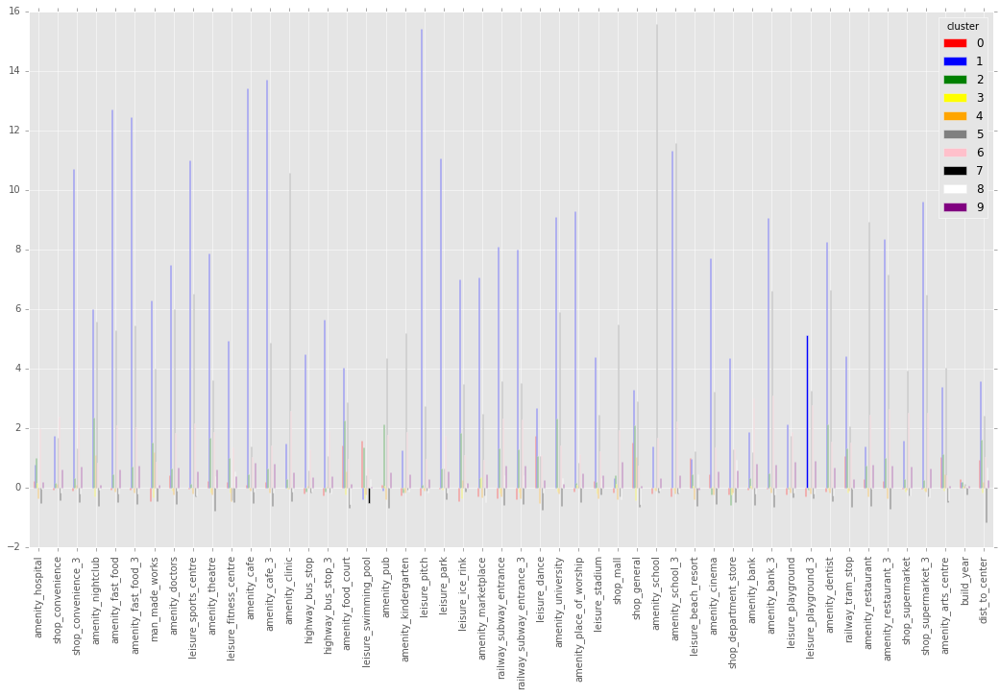

In [26]:
data_temp = pd.DataFrame(data=X, columns=data.columns)
data_temp['cluster'] = y
grouped = data_temp.groupby('cluster').mean()
grouped.transpose().plot.bar(use_index = True, color=color_names);

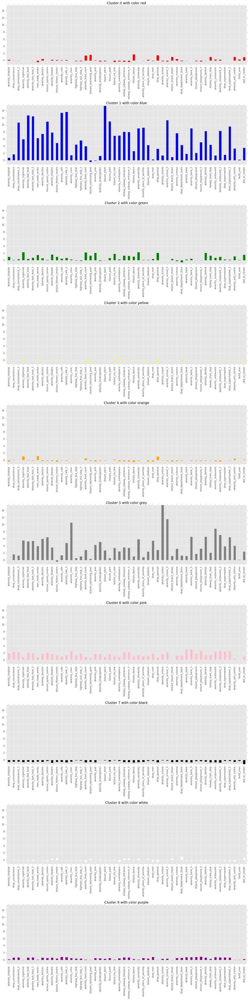

In [29]:
plt.figure(figsize=(15, grouped.shape[0] * 6))
ymax = grouped.values.max()
ymin = grouped.values.min()

for i in range(grouped.shape[0]):
    plt.subplot(grouped.shape[0], 1, i+1)
    grouped.iloc[i, :].plot.bar(color=color_names[i])
    plt.ylim((ymin, ymax))
    plt.title('Cluster %d with color %s' % (i, color_names[i]))
    
plt.tight_layout()